# Extract the quadrat from all still images in dataset

> Develop Python scripts to organize and pre-process underwater mussel image data for ingestion by computer vision model, including:
>> b. Cropping of stills within quadrats

### To successfully extract a quadrat the algorithm assumes:

- All four corners of the quadrat are contained in the image, i.e.~the side lengths or corners are not 
cropped from the scene.

- The quadrat side lengths are not occluded, e.g., by diver equipment, mesh bags, or vegetation.

- The image is sufficiently clear, i.e.~not turbulent or cloudy from disrupted sediment.

- The camera angle is within $65-90^{\circ}$ with respect to the top surface of the quadrat.
Note that this is separate from quadrat rotation in the camera plane, which can be arbitrary.

- The camera is not too far from the quadrat such that the side lengths are less than 400 pixels 
for $1080 \times 1440$ resolution, 500 pixels for $1080 \times 1920$ HD resolution, or 400 for portrait mode in HD res.

The algorithm still works reasonably well in some cases even when the assumptions are violated, e.g., input 7 with the mesh bag covering one of the corners, as missing corner coordinates can sometimes be inferred if enough complementary lines are detected. Conversely, even when the assumptions are satisfied, a best effort is made to extract the *interior* of the quadrat, but this occaisionally won't be possible due to missing or misleading lines and part of the quadrat may be included in the output.

Prior to running this notebook you must set:

1. The `DRAW` variable annotates intermediate results on the image and is nice for visualizing results. It 
should be set to False for saving the final output.

2. The default values for all other parameters can be left as they are.

When `DRAW=True`, you will see annotations in the __Post-Processing__ pane.
- Large green circles are corner centroids found by K-means
- Medium blue circles are all line intersection points after the final stage of processing
- Small white circles are proposed crop locations (the quadrat interior corner points)
- The X lines corresponding to 'Using X of Y lines' after rejecting outliers and merging similar lines are shown in blue

On completion you should have 26 cropped images in the folder `My Drive/Data/Quadrat_Extraction_from_Stills`

Dependencies:
- `opencv.__version__==4.2.0`
- `skimage.__version__==0.16.2` 

In [1]:
DRAW = True

In [2]:
import os
import os.path as osp
import sys

IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    DATA_PATH = r'/content/drive/My Drive/Data'
    SAVE_PATH = osp.join(DATA_PATH, 'Quadrat_Extraction_from_Stills')
    
    # cd into current directory so local imports work
    %cd '/content/drive/My Drive/cciw-zebra-mussel/quadrat-extraction/'
else:
    DATA_PATH = osp.join(os.environ['DATA_PATH'], 'cciw/Data')
    SAVE_PATH = osp.join(os.environ['DATA_PATH'], 'cciw/dataset_raw/quadrat-extraction/stills-v3-1')
    
if not osp.exists(SAVE_PATH):
    os.mkdir(SAVE_PATH)

print('Reading data from', DATA_PATH)    
print('Saving cropped images to', SAVE_PATH)    

Reading data from /media/angus/cciw/Data
Saving cropped images to /media/angus/cciw/dataset_raw/quadrat-extraction/stills-v3-1


In [7]:
import cv2
print('Loaded OpenCV version', cv2.__version__)
import numpy as np

import time
from glob import glob

# local import
from utils import crop_still_image
from utils import compute_pairwise_distances
from utils import centroid_and_crop_kmeans

import matplotlib.pyplot as plt

Loaded OpenCV version 4.2.0


In [8]:
# Search for all still files in the datset
stills = glob(os.path.join(DATA_PATH,'Videos_and_stills/GLNI/*/*/*/Stills/Quad*/*.jpg'))
print('Found %d still images' % len(stills))

Found 67 still images


In [9]:
# indices of data in x and y position respectively
X, Y = 0, 1

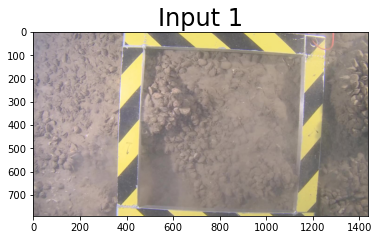

Using 9 of 13 lines
Processing took 0.91 sec


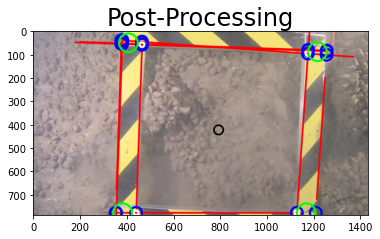

Successfully cropped image  0


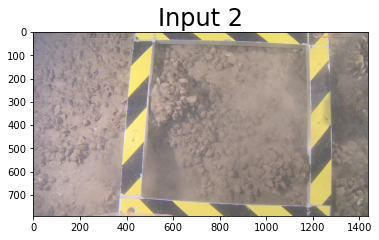

Using 8 of 13 lines
Processing took 1.06 sec


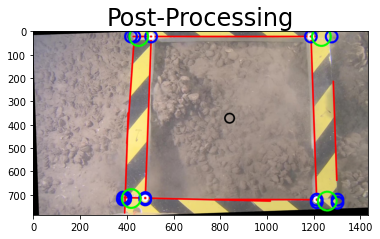

Successfully cropped image  1


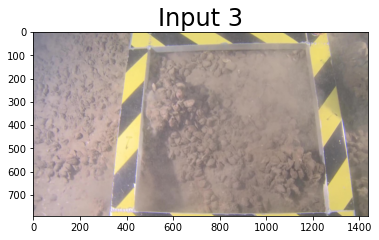

Using 7 of 12 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.65 sec


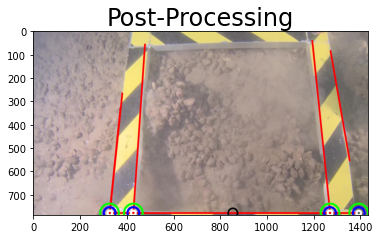

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  2


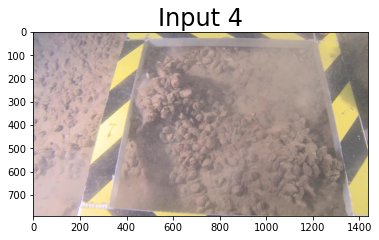

Using 2 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.47 sec


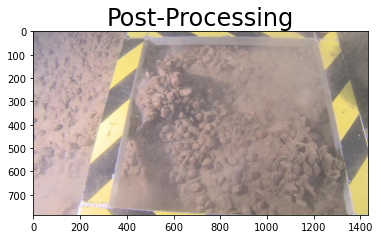

Exit: insufficient number of corner points found


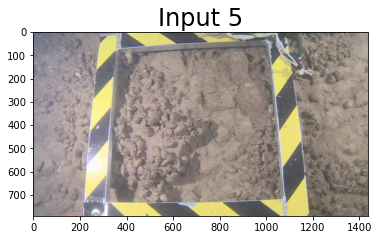

Using 8 of 14 lines
Processing took 1.87 sec


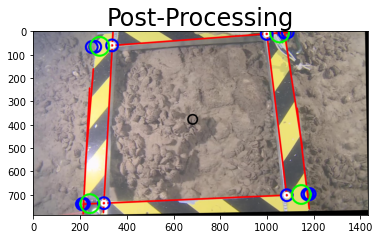

Successfully cropped image  4


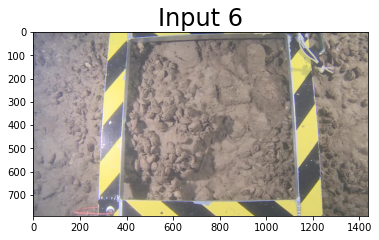

Using 8 of 14 lines
Processing took 1.87 sec


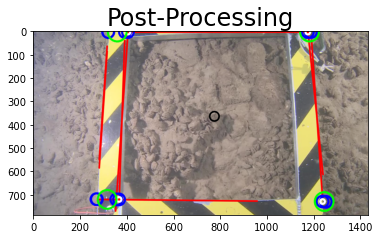

Exit: side lengths are not equal


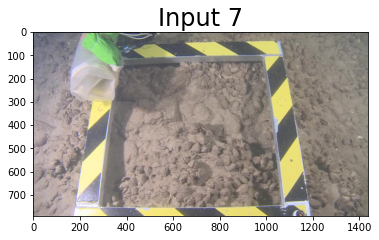

Using 7 of 12 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 1.56 sec


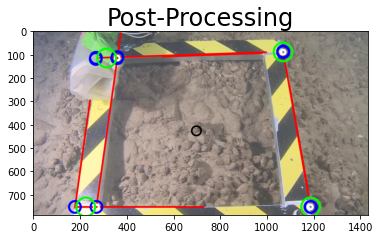

Exit: side lengths are not equal


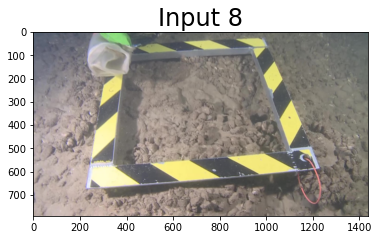

Using 2 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.96 sec


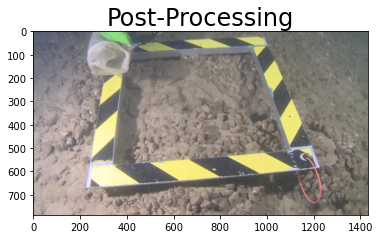

Exit: insufficient number of corner points found


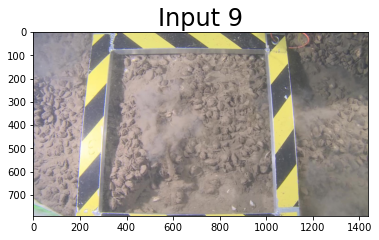

Using 8 of 14 lines
Processing took 1.72 sec


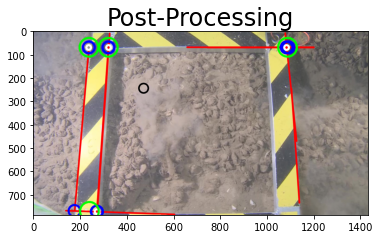

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


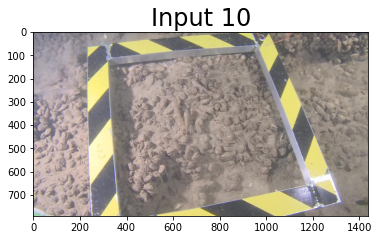

Using 9 of 13 lines
Processing took 1.57 sec


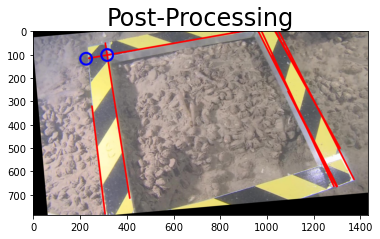

Exit: insufficient number of corner points found


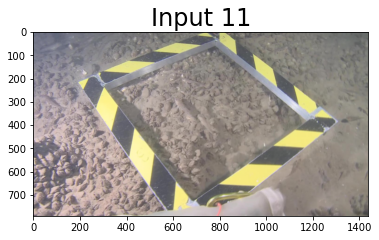

Using 5 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 1.36 sec


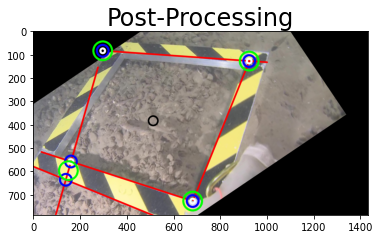

Exit: side lengths are not equal


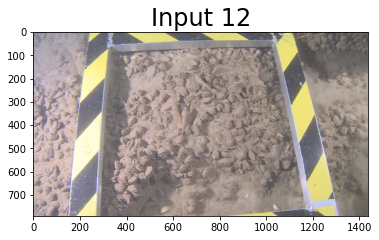

Using 5 of 11 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 2.16 sec


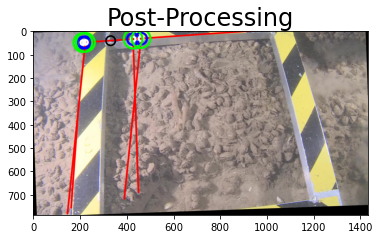

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side length too small.


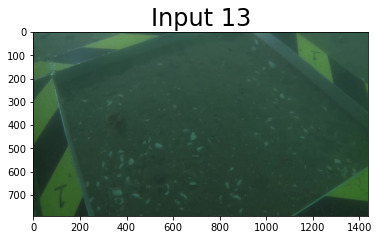

Using 2 of 5 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.03 sec


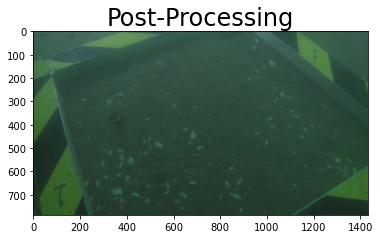

Exit: insufficient number of corner points found


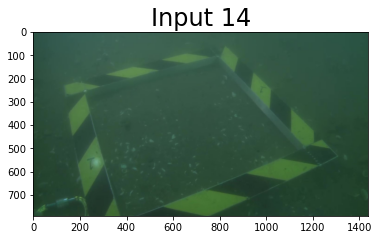

Using 5 of 9 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.17 sec


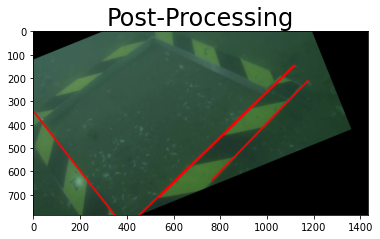

Exit: insufficient number of corner points found


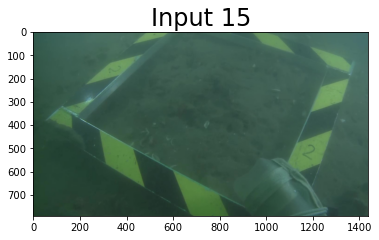

Using 3 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.06 sec


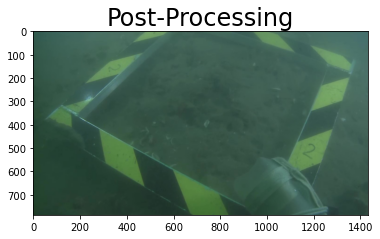

Exit: insufficient number of corner points found


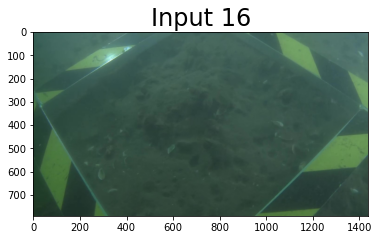

Using 5 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.24 sec


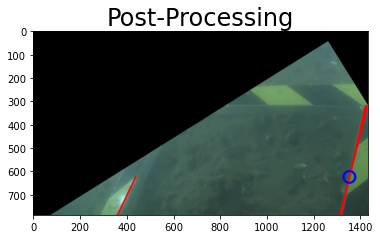

Exit: insufficient number of corner points found


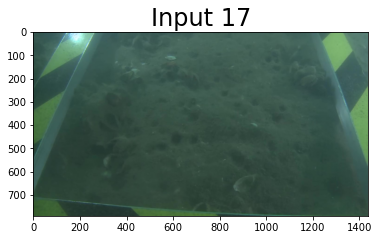

Using 1 of 10 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.05 sec


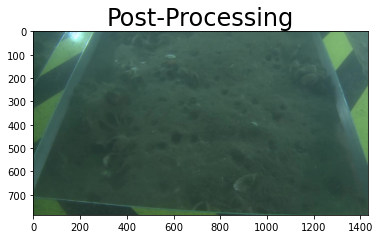

Exit: insufficient number of corner points found


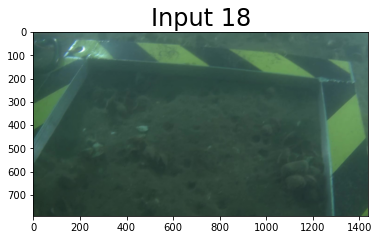

Using 4 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.18 sec


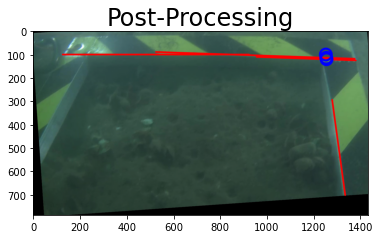

Exit: insufficient number of corner points found


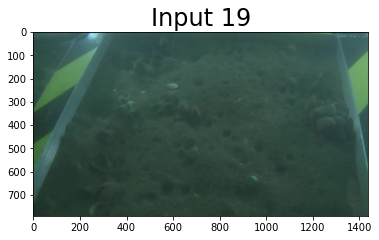

Using 2 of 11 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.04 sec


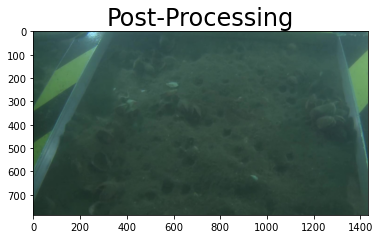

Exit: insufficient number of corner points found


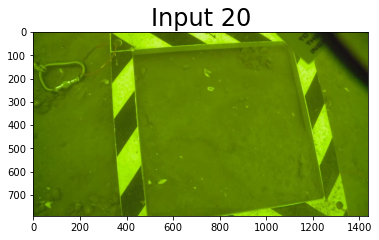

Using 9 of 14 lines
Processing took 0.35 sec


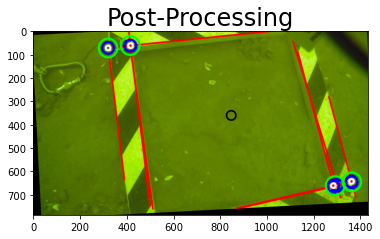

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


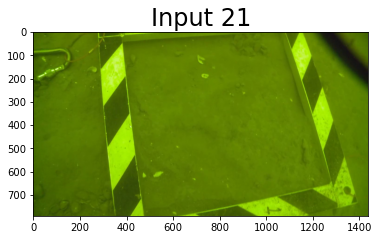

Using 11 of 14 lines
Processing took 0.43 sec


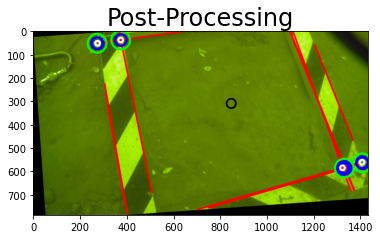

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


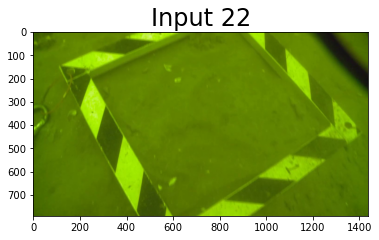

Using 8 of 14 lines
Processing took 0.42 sec


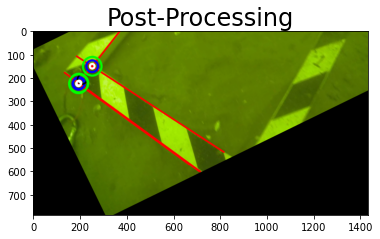

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Exit: side length too small.


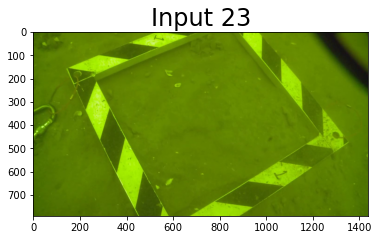

Using 9 of 14 lines
Processing took 0.56 sec


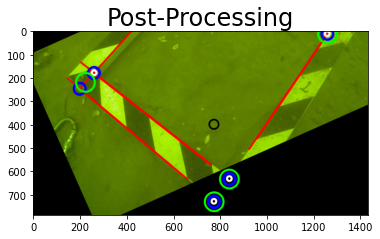

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Successfully cropped image  22


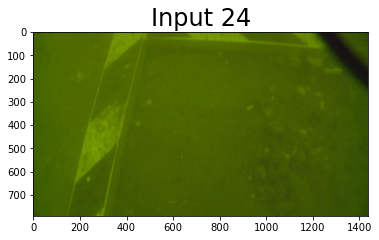

Using 6 of 10 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.18 sec


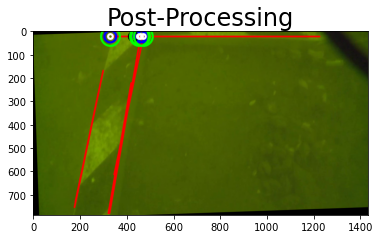

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side length too small.


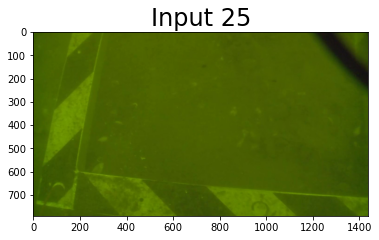

Using 6 of 9 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.20 sec


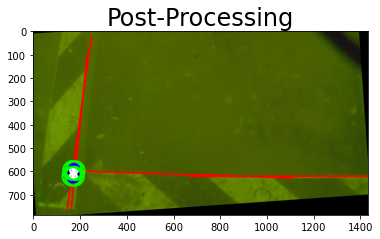

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Exit: side length too small.


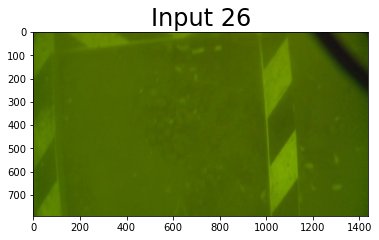

Using 2 of 3 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.01 sec


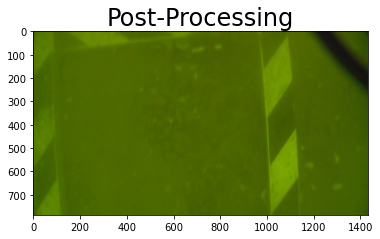

Exit: insufficient number of corner points found


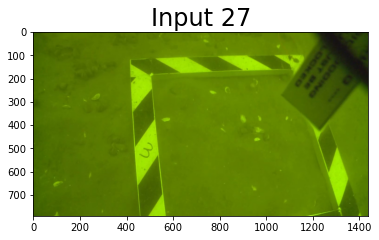

Using 7 of 12 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.18 sec


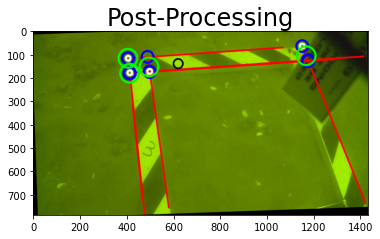

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  26


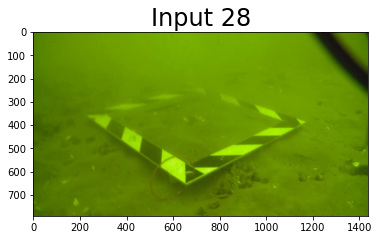

Using 5 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.17 sec


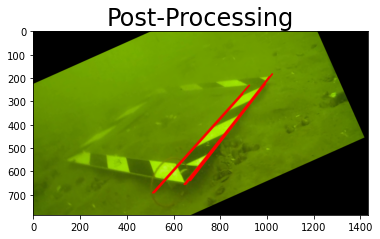

Exit: insufficient number of corner points found


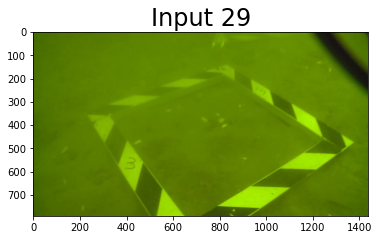

Using 2 of 8 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.02 sec


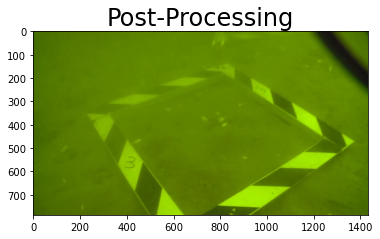

Exit: insufficient number of corner points found


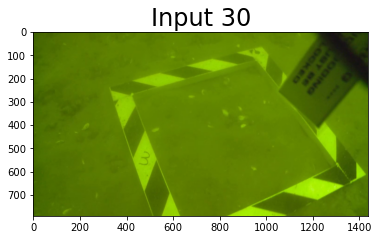

Using 5 of 9 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.21 sec


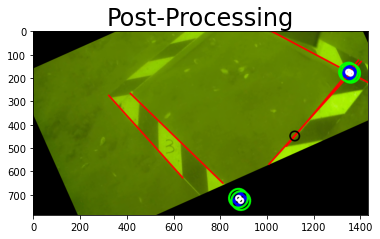

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Successfully cropped image  29


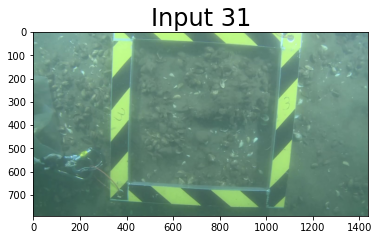

Using 8 of 14 lines
Processing took 0.44 sec


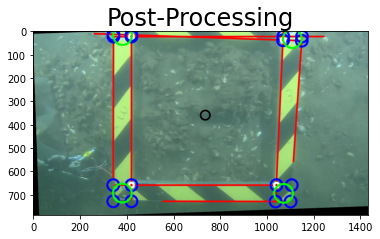

Successfully cropped image  30


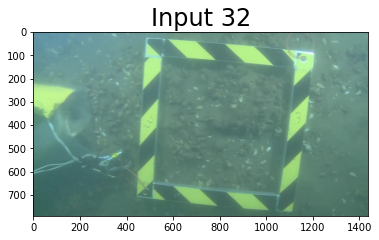

Using 6 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.29 sec


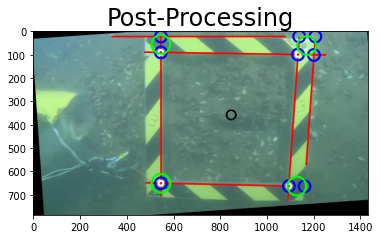

Successfully cropped image  31


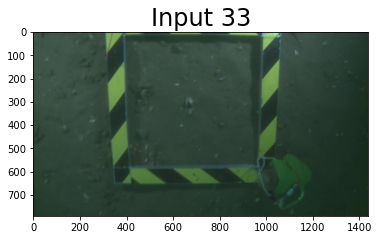

Using 7 of 11 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.27 sec


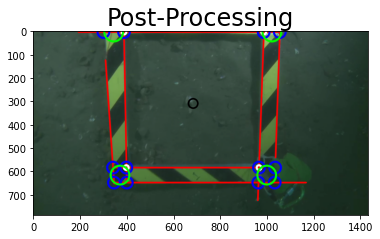

Successfully cropped image  32


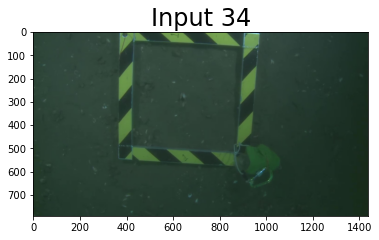

Using 10 of 14 lines
Processing took 0.21 sec


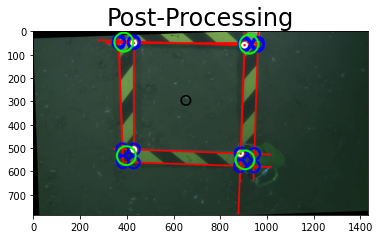

Successfully cropped image  33


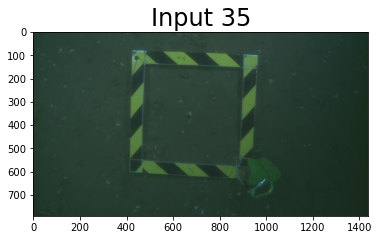

Using 8 of 11 lines
Processing took 0.20 sec


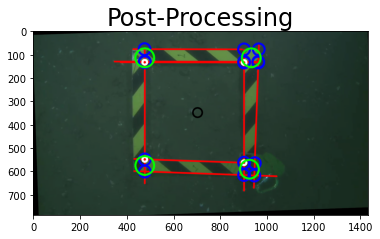

Successfully cropped image  34


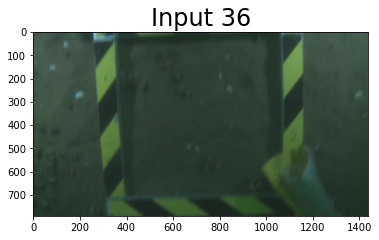

Using 4 of 9 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.15 sec


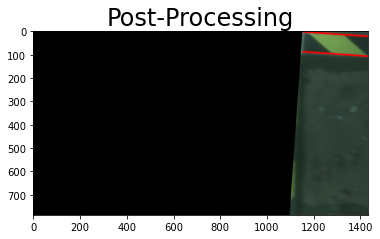

Exit: insufficient number of corner points found


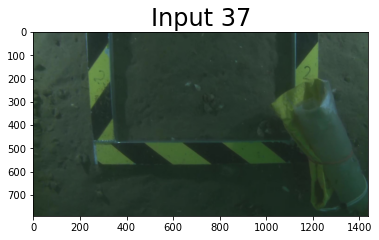

Using 6 of 11 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.18 sec


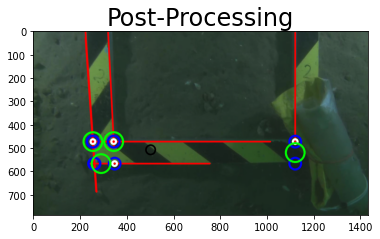

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


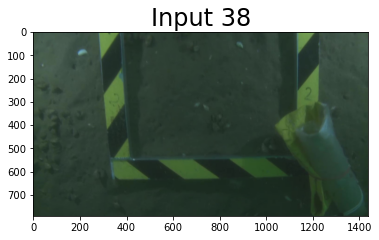

Using 4 of 8 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.20 sec


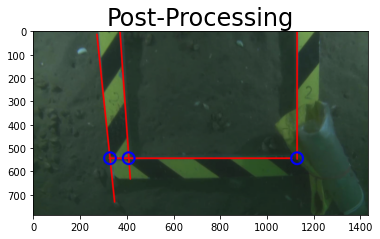

Exit: insufficient number of corner points found


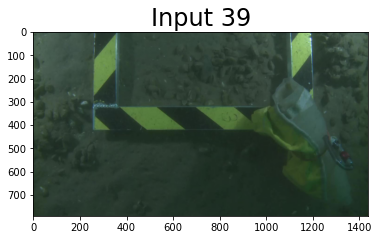

Using 8 of 13 lines
Processing took 0.20 sec


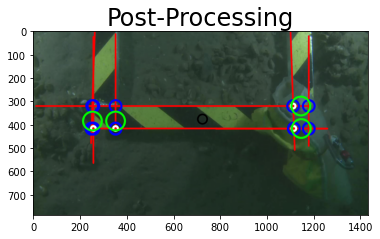

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


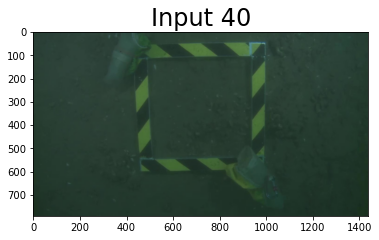

Using 9 of 12 lines
Processing took 0.19 sec


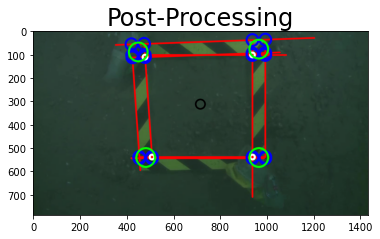

Successfully cropped image  39


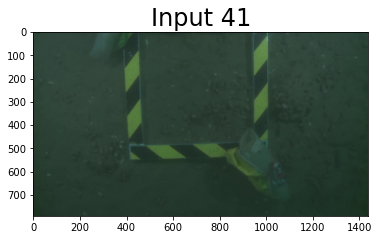

Using 6 of 10 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.18 sec


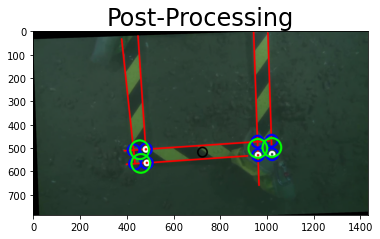

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  40


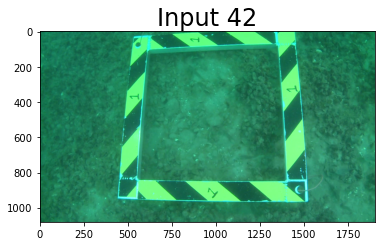

Using 10 of 14 lines
Processing took 0.78 sec


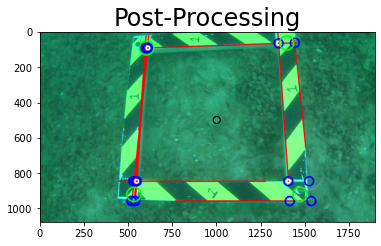

Successfully cropped image  41


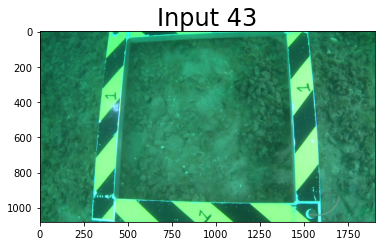

Using 11 of 14 lines
Processing took 0.92 sec


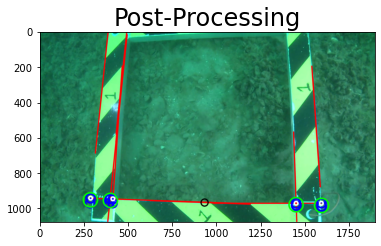

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  42


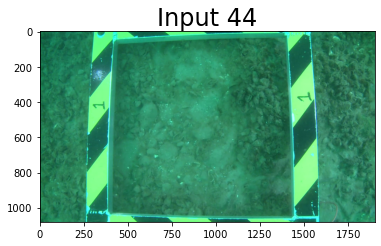

Using 10 of 13 lines
Processing took 0.93 sec


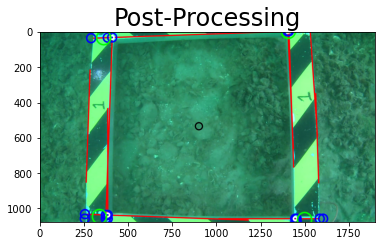

Successfully cropped image  43


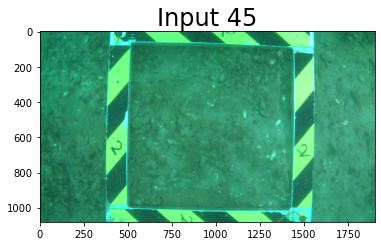

Using 10 of 12 lines
Processing took 0.71 sec


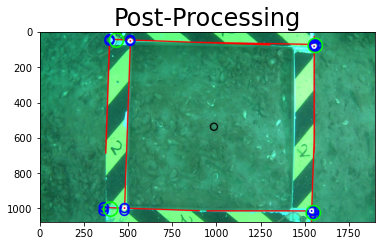

Exit: side lengths are not equal


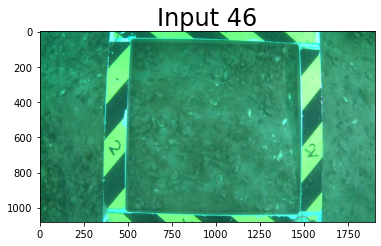

Using 10 of 14 lines
Processing took 0.62 sec


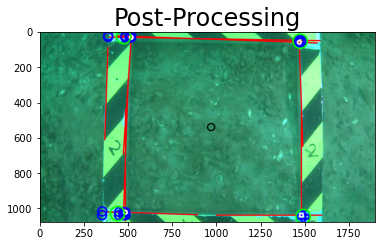

Successfully cropped image  45


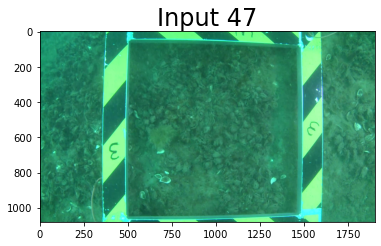

Using 8 of 9 lines
Processing took 0.72 sec


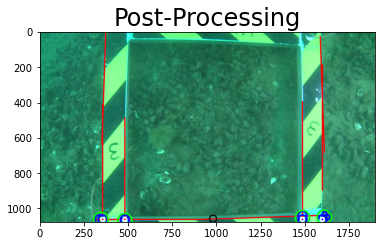

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  46


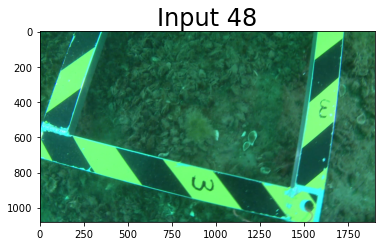

Using 10 of 13 lines
Processing took 0.98 sec


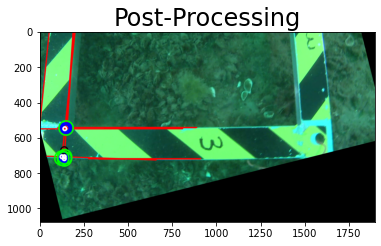

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Exit: side length too small.


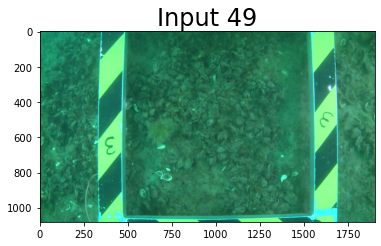

Using 12 of 13 lines
Processing took 0.69 sec


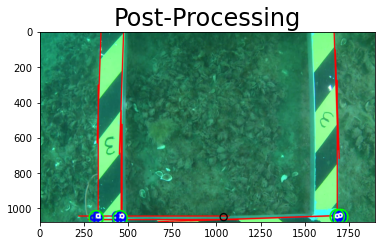

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Exit: side lengths are not equal


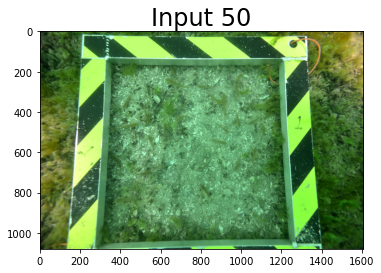

Using 2 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 3.55 sec


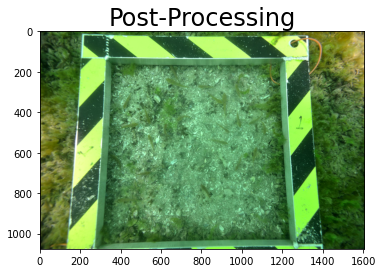

Exit: insufficient number of corner points found


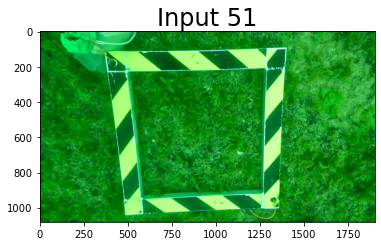

Using 9 of 14 lines
Processing took 4.11 sec


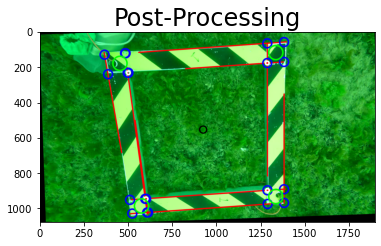

Successfully cropped image  50


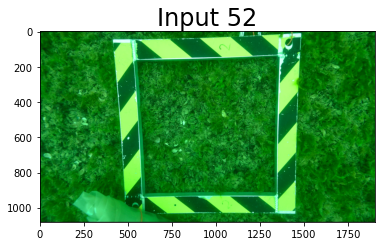

Using 10 of 14 lines
Processing took 4.80 sec


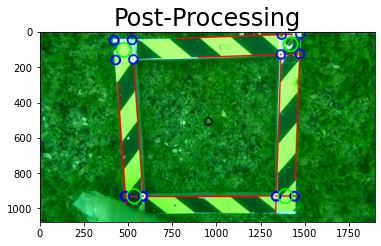

Successfully cropped image  51


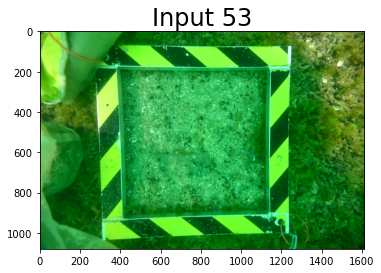

Using 9 of 13 lines
Processing took 3.61 sec


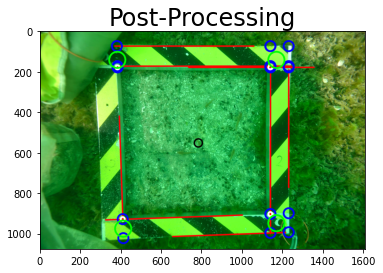

Successfully cropped image  52


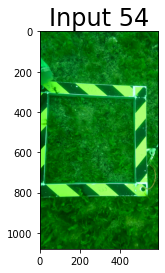

Using 9 of 14 lines
Processing took 1.07 sec


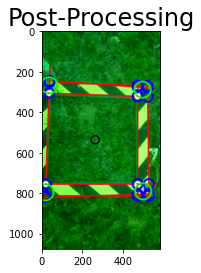

Successfully cropped image  53


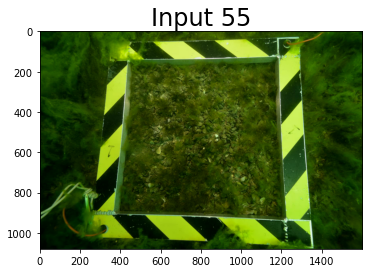

Using 7 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 1.97 sec


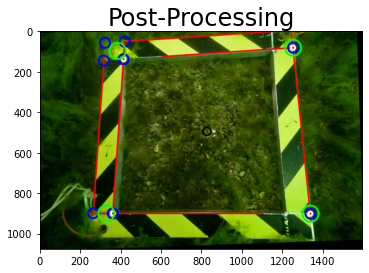

Exit: side lengths are not equal


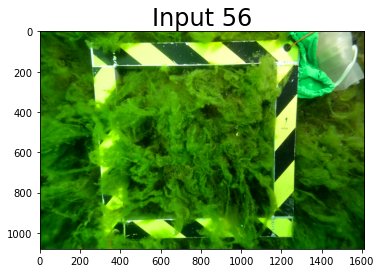

Using 7 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 1.17 sec


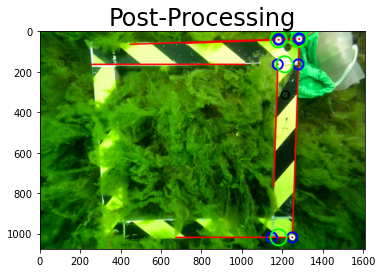

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Successfully cropped image  55


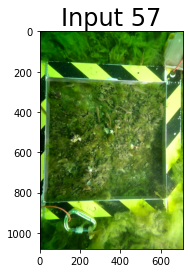

Using 5 of 8 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 2.03 sec


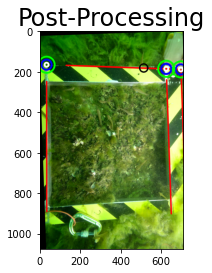

Corners do not form a square, attempting to crop based on one side length
Found horizontal line
Successfully cropped image  56


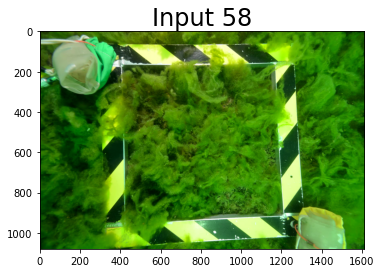

Using 7 of 12 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 1.53 sec


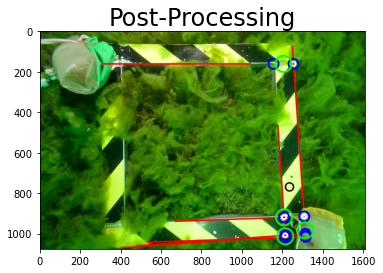

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Successfully cropped image  57


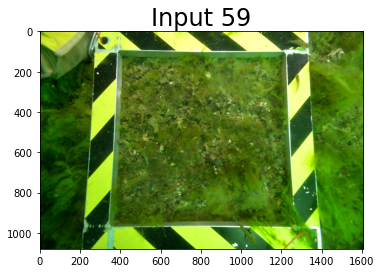

Using 5 of 13 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 2.17 sec


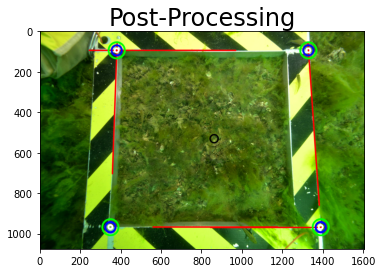

Exit: side lengths are not equal


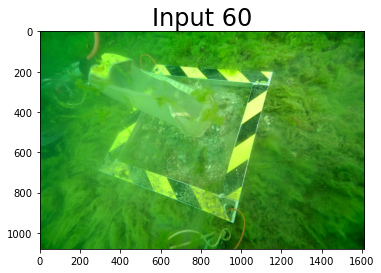

Using 7 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.80 sec


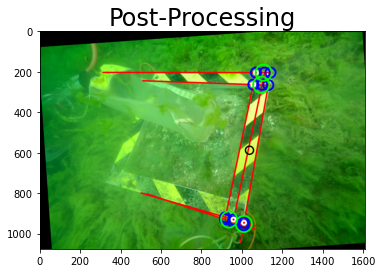

Corners do not form a square, attempting to crop based on one side length
Found vertical line
Successfully cropped image  59


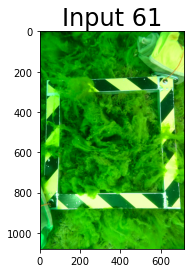

Using 9 of 14 lines
Processing took 1.36 sec


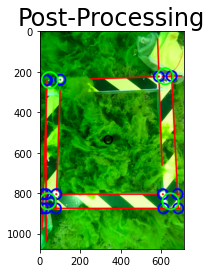

Successfully cropped image  60


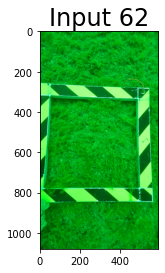

Using 9 of 13 lines
Processing took 1.90 sec


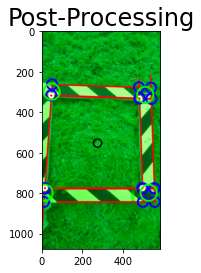

Successfully cropped image  61


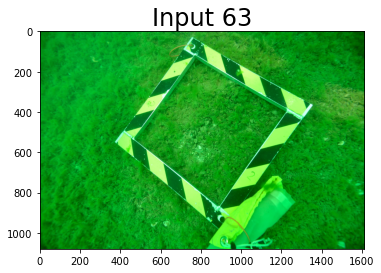

Using 6 of 14 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 3.77 sec


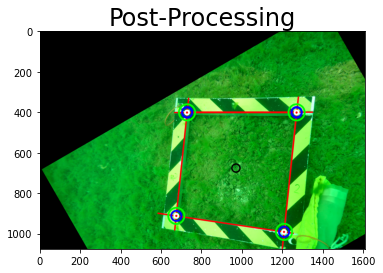

Successfully cropped image  62


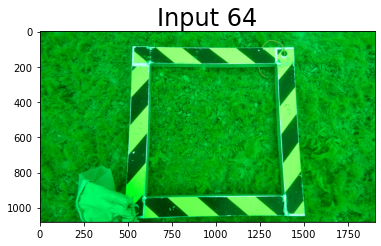

Using 11 of 13 lines
Processing took 4.88 sec


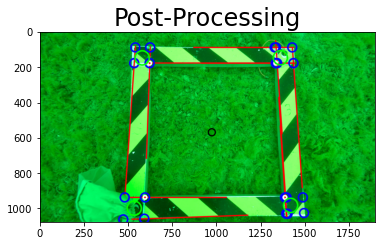

Successfully cropped image  63


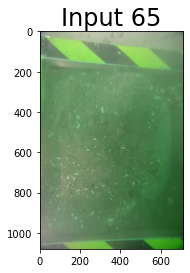

Using 1 of 2 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.04 sec


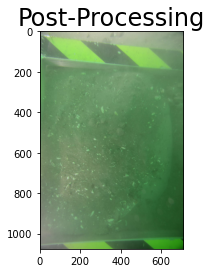

Exit: insufficient number of corner points found


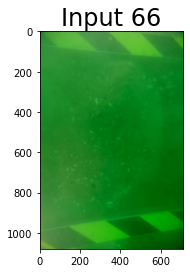

Processing took 0.01 sec


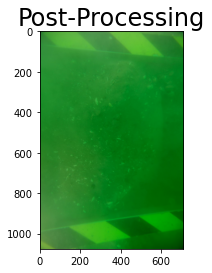

Exit: insufficient number of corner points found


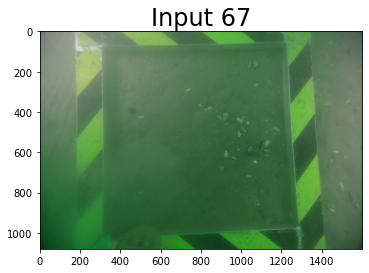

Using 5 of 5 lines
It is likely that: 
 i)  all four quadtrat corners are not visible 
 ii) image is blurry, or partly occluded
Processing took 0.23 sec


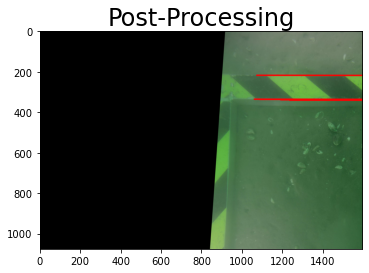

Exit: insufficient number of corner points found


In [10]:
for i in range(len(stills)):

    # load the input image
    bgr = cv2.imread(stills[i])

    out_file = stills[i].split('/')[-1].split('.')[0] + '_crop.jpg'

    # set parameters according to input resolution
    if bgr.shape[1] == 1440:
        """x_trim and y_trim are used to remove black padding
        for 1080x1440 video which triggers spurious edges"""
        x_trim, y_trim = 1, 145
        bgr = bgr[y_trim:-y_trim, x_trim:-x_trim, :]
        crop_frame_border = True

        """@param canny_thresh initial hysteresis values for Canny edge 
        detector, input to HoughLines"""
        canny_thresh1, canny_thresh2 = 10, 45
        """@param threshold Accumulator threshold, return 
        lines with more than threshold of votes. (intersection points)"""
        threshold = 125
        """@param minLineLength Minimum line length. 
        Line segments shorter than that are rejected. (pixels)"""
        mLL = 400
        """@param maxLineGap Maximum allowed gap between points 
        on the same line to link them. (pixels)"""
        mLG = 150

    elif bgr.shape[1] == 1920:
        """@param canny_thresh initial hysteresis values for Canny 
        edge detector, input to HoughLines"""
        canny_thresh1, canny_thresh2 = 40, 100
        """@param threshold Accumulator threshold, return 
        lines with more than threshold of votes. (intersection points)"""
        threshold = 125
        """@param minLineLength Minimum line length. 
        Line segments shorter than that are rejected. (pixels)"""
        mLL = 500
        """@param maxLineGap Maximum allowed gap between points 
        on the same line to link them. (pixels)"""
        mLG = 150

        # this checks to see if images contain zero padding
        for pad_idx in range(bgr.shape[1]):
            if bgr[:, pad_idx].mean() > 1:
                break
        """if pad_idx > 500 it means the HD image is in 
        portrait mode and the side lengths are smaller."""
        if pad_idx > 500:
            mLL = 400

        h_pad = 10
        bgr = bgr[:, pad_idx + h_pad:-(h_pad + pad_idx), :]

    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    plt.close('all')
    plt.figure()
    plt.imshow(rgb)
    plt.title('Input %d' % (i + 1), fontsize=24)
    plt.show()

    start_time = time.time()
    bgr, edges, crop = crop_still_image(
        bgr, mll=mLL, mlg=mLG, threshold=threshold, canny_1=canny_thresh1, canny_2=canny_thresh2, do_draw=DRAW)
    print('Processing took %.2f sec' % float(time.time() - start_time))

    plt.figure()
    plt.imshow(cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB))
    plt.title('Post-Processing', fontsize=24)
    plt.show()

    try:
        x_start = crop[:, X].min()
        x_end = crop[:, X].max()
        y_start = crop[:, Y].min()
        y_end = crop[:, Y].max()

        if (compute_pairwise_distances(crop)[:, 2] < mLL).sum():
            print('Corners do not form a square, attempting to crop based on one side length')

            centroid, crop, cluster_centers = centroid_and_crop_kmeans(crop, 2)

            if crop.var(axis=0)[X] > crop.var(axis=0)[Y]:
                print('Found horizontal line')
                y_ref = int(crop[:, Y].mean())
                x_start = crop[:, X].min()
                x_end = crop[:, X].max()

                # call this y_ref because we don't know if it's top or bottom
                delta = x_end - x_start

                if (y_ref + delta) > bgr.shape[0]:
                    y_start = np.maximum(y_ref - delta, 0)
                    y_end = y_ref
                else:
                    y_end = np.minimum(y_ref + delta, bgr.shape[0])
                    y_start = y_ref

            else:
                print('Found vertical line')
                # call this x_ref because we don't know if it's left or right
                x_ref = int(crop[:, X].mean())
                y_start = crop[:, Y].min()
                y_end = crop[:, Y].max()
                delta = y_end - y_start

                if (x_ref + delta) > bgr.shape[1]:
                    x_start = np.maximum(x_ref - delta, 0)
                    x_end = x_ref
                else:
                    x_end = np.minimum(x_ref + delta, bgr.shape[1])
                    x_start = x_ref

        dy = y_end - y_start
        dx = x_end - x_start
        if np.abs(dy - dx) < 100:
            if dy > mLL:
                try:
                    plt.figure()
                    plt.imshow(bgr[y_start:y_end, x_start:x_end, :])
                    cv2.imwrite(osp.join(SAVE_PATH, out_file),
                                bgr[y_start:y_end, x_start:x_end, :])
                    print('Successfully cropped image ', i)
                except:
                    print('Problem saving ', out_file)
            else:
                print('Exit: side length too small.')
        else:
            print('Exit: side lengths are not equal')
    except:
        print('Exit: insufficient number of corner points found')

# End demo

In [ ]:
# to plot all still images
for i in range(len(stills)):
    bgr = cv2.imread(stills[i])
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    plt.close('all')
    plt.figure(figsize=(10, 8))
    plt.imshow(bgr[::2, ::2, :])
    plt.title(i + 1)
    plt.show()

In [ ]:
'''
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
fig, ax1 = plt.subplots(1, 1, figsize=(8, 5))
#bgr = cv2.imread(stills[i])
#rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
ax1.imshow(img)
#ax1.imshow(edges)
#ax1.set_title('Canny edges', fontsize=16)
#ax2.imshow(bgr)
#ax2.set_title('Still image with corner points', fontsize=16)
ax1.axis('off')
#ax2.axis('off')
plt.tight_layout()
plt.show()
#fig.savefig('quatract-extraction-still-%d-step-4.pdf' % i)
'''